# Testing Diffusion t-SNE on Farrell et al. 2018 data

This notebook shows the advantages of Diffusion t-SNE using an example of dataset generated by Farrell et al. 2018 in a study:
["Single-cell reconstruction of developmental trajectories during zebrafish embryogenesis"](https://science.sciencemag.org/content/sci/360/6392/eaar3131.full.pdf).

We show how multi-scale views of the input data can be generated using our method. In particular, small scale to large scale structures can be learned by varying the time step parameter of Diffusion t-SNE. Unlike varying the vanilla t-SNE perplexity parameter, this procedures results in an effective representation of global data geometry evem if the data lies around a non-linear, potentially curved manifold.

In [1]:
# First we load all the necessary packages and functions
import os, sys, mkl, time, pickle
nthreads = 20                                  # limit the number of threads for all operations
os.environ["OMP_NUM_THREADS"] = str(nthreads)  # must be set before loading numpy
mkl.set_num_threads(nthreads)
import numpy as np
import pandas as pd
import multiprocessing as mp

# plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.titlesize'] = 24
mpl.rcParams['axes.titlesize']   = 20
mpl.rcParams['axes.labelsize']   = 20
mpl.rcParams['xtick.labelsize']  = 20
mpl.rcParams['ytick.labelsize']  = 20


# Custom pyscripts
maindir = '/home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE'
os.chdir(maindir)
sys.path.insert(0, maindir)
from diffusion_tsne import diffusion_tsne
from plotting import *
from generate_data import *
from utils import *
from metrics import *

%load_ext autoreload
%autoreload 2

MACHINE_EPSILON = np.finfo(np.double).eps

# Load preprocessed data
cell_info = pd.read_pickle("data/farrell2018/farrell_cell_info.pkl")
df = pd.read_pickle("data/farrell2018/farrell_all_samples.pkl")
df.shape

# Colors to match the original paper by Farrell et al.
cols = ['#cccccc', '#999999', '#cab2d6', '#6a3d9a', '#fdbf6f', '#ff7f00', 
        '#fb9a99', '#e31a1c', '#b2df8a', '#33a02c', '#a6cee3', '#1f78b4']

We download all the data files available on the Broad Institute single cell data portal (log-in required) from:
https://portals.broadinstitute.org/single_cell/study/SCP162/single-cell-reconstruction-of-developmental-trajectories-during-zebrafish-embryogenesis

In [3]:
%%bash
cd ./data/farrell2018
gunzip URD_Dropseq_Expression_Log2TPM.txt.gz;

## Load data

In [8]:
# Note that the data is already in the log2 TPM format!
filename = "./data/farrell2018/URD_Dropseq_Expression_Log2TPM.txt"  # large file: 1.5GB
dftest = pd.read_table(filename, nrows = 5, index_col=0)
print(dftest.shape)

(5, 38731)


In [13]:
dftest.iloc[:, 1:5]

,ZFHIGH_WT_DS5_AAACAAGTGTAT,ZFHIGH_WT_DS5_AAACACCTCGTC,ZFHIGH_WT_DS5_AAATGAGGTTTN,ZFHIGH_WT_DS5_AACCCTCTCGAT
GENE,,,,
A2M,0,0,0,0
AAAS,0,0,0,0
AACS,0,0,0,0
AADACL4,0,0,0,0
AADAT,0,0,0,0


In [14]:
start = time.time()
df = pd.read_table(filename, index_col=0)
end = time.time()
print("Read (%d x %d) table with pandas in %f sec.\n"
      %(df.shape[0], df.shape[1], end - start))
# Read (17239 x 38731) table with pandas in 2091.302009 sec.

Read (17239 x 38731) table with pandas in 2091.302009 sec.



In [15]:
df.transpose().to_pickle("data/farrell2018/farrell_all_samples.pkl")

In [18]:
df = df.transpose()
df.iloc[0:5, 1:5]

GENE,AAAS,AACS,AADACL4,AADAT
ZFHIGH_WT_DS5_AAAAGTTGCCTC,0.0,0.0,0.0,0.0
ZFHIGH_WT_DS5_AAACAAGTGTAT,0.0,0.0,0.0,0.0
ZFHIGH_WT_DS5_AAACACCTCGTC,0.0,0.0,0.0,0.0
ZFHIGH_WT_DS5_AAATGAGGTTTN,0.0,0.0,0.0,0.0
ZFHIGH_WT_DS5_AACCCTCTCGAT,0.0,0.0,0.0,0.0


In [22]:
df.shape

(38731, 17239)

In [39]:
cell_info = pd.read_table("./data/farrell2018/URD_Dropseq_Meta.txt", index_col = 0)
cell_info = cell_info.iloc[1:,]
cell_info.head()

,Stage,Segment,Lineage_Spinal_Cord,Lineage_Diencephalon,Lineage_Optic_Cup,Lineage_Midbrain_Neural_Crest,Lineage_Hindbrain_R3,Lineage_Hindbrain_R4_5_6,Lineage_Telencephalon,Lineage_Epidermis,...,Lineage_Hematopoeitic_ICM,Lineage_Hematopoeitic_RBI_Pronephros,Lineage_Endoderm_Pharyngeal,Lineage_Endoderm_Pancreatic_Intestinal,Lineage_Heart_Primordium,Lineage_Cephalic_Mesoderm,Lineage_Prechordal_Plate,Lineage_Notochord,Lineage_Primordial_Germ_Cells,Lineage_EVL
NAME,,,,,,,,,,,,,,,,,,,,,
ZFHIGH_WT_DS5_AAAAGTTGCCTC,03.3-HIGH,82,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,...,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE
ZFHIGH_WT_DS5_AAACAAGTGTAT,03.3-HIGH,82,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,...,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE
ZFHIGH_WT_DS5_AAACACCTCGTC,03.3-HIGH,82,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,...,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE
ZFHIGH_WT_DS5_AAATGAGGTTTN,03.3-HIGH,38,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE
ZFHIGH_WT_DS5_AACCCTCTCGAT,03.3-HIGH,82,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,...,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE


In [40]:
print(df.index[0:10])
print(cell_info.index[0:10])
np.all(df.index == cell_info.index)

Index(['ZFHIGH_WT_DS5_AAAAGTTGCCTC', 'ZFHIGH_WT_DS5_AAACAAGTGTAT',
       'ZFHIGH_WT_DS5_AAACACCTCGTC', 'ZFHIGH_WT_DS5_AAATGAGGTTTN',
       'ZFHIGH_WT_DS5_AACCCTCTCGAT', 'ZFHIGH_WT_DS5_AACGAAAGGTAA',
       'ZFHIGH_WT_DS5_AAGAAAGGGAAG', 'ZFHIGH_WT_DS5_AAGATACAGCGC',
       'ZFHIGH_WT_DS5_AAGATTAGGCCA', 'ZFHIGH_WT_DS5_AAGCACGCGTCA'],
      dtype='object')
Index(['ZFHIGH_WT_DS5_AAAAGTTGCCTC', 'ZFHIGH_WT_DS5_AAACAAGTGTAT',
       'ZFHIGH_WT_DS5_AAACACCTCGTC', 'ZFHIGH_WT_DS5_AAATGAGGTTTN',
       'ZFHIGH_WT_DS5_AACCCTCTCGAT', 'ZFHIGH_WT_DS5_AACGAAAGGTAA',
       'ZFHIGH_WT_DS5_AAGAAAGGGAAG', 'ZFHIGH_WT_DS5_AAGATACAGCGC',
       'ZFHIGH_WT_DS5_AAGATTAGGCCA', 'ZFHIGH_WT_DS5_AAGCACGCGTCA'],
      dtype='object', name='NAME')


True

In [41]:
pd.crosstab(index = cell_info.Stage, columns = "Count")

col_0,Count
Stage,
03.3-HIGH,311
03.8-OBLONG,200
04.3-DOME,1158
04.8-30%,1467
05.3-50%,5716
06.0-SHIELD,1026
07.0-60%,4101
08.0-75%,6178
09.0-90%,5442


In [46]:
cell_info.to_pickle("data/farrell2018/farrell_cell_info.pkl")

# PCA

In [3]:
X = df.values
# center the columns
X_colmean = X.mean(axis = 0)
X_cntr = X - X_colmean[np.newaxis, :]

In [4]:
# Do randomized PCA/SVD and keep 50 dimensions
from sklearn.utils.extmath import randomized_svd
nPC = 50; seed = int(time.time())
U, s, VT = randomized_svd(X_cntr, n_components=nPC, random_state=seed)
X50PCs = np.dot(U, np.diag(s))
X50PCs.shape

(38731, 50)

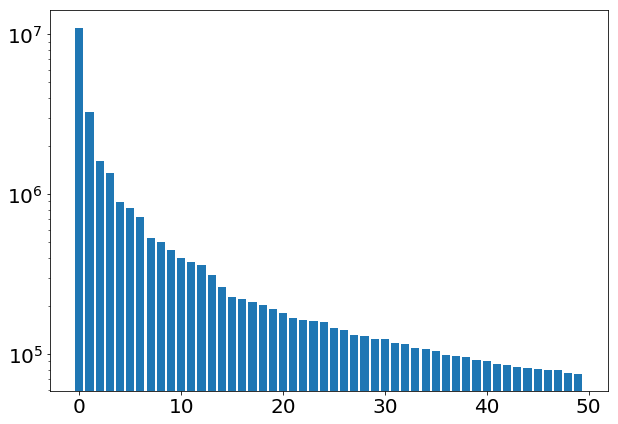

In [5]:
plt.figure(figsize = (10, 7))
plt.bar(range(nPC), s**2, log = True)
var_exp = np.round(100*s**2/np.sum(s**2))

/home/lanhuong/.local/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


Text(0, 0.5, 'PC2 [12.0 %]')

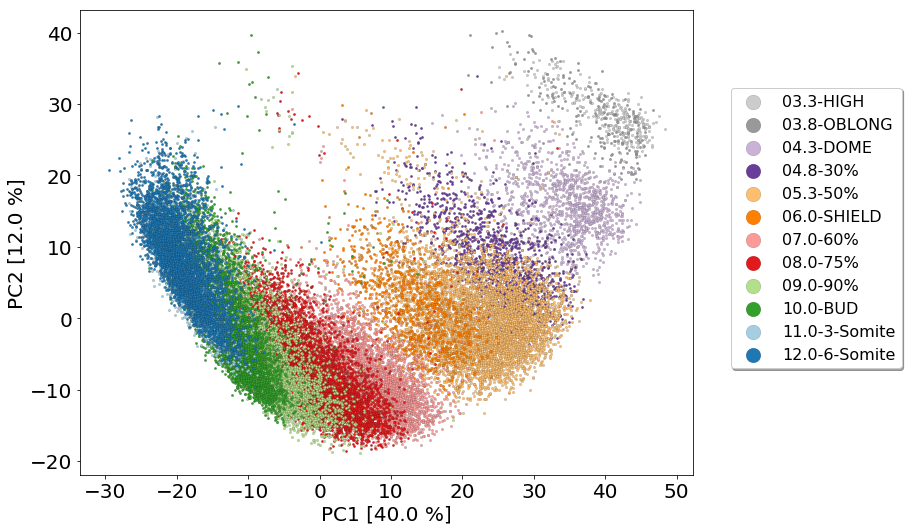

In [6]:
plot2D(X50PCs[:, 0:2], label=cell_info["Stage"], 
       col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axes().set_aspect(aspect=1)
plt.xlabel("PC1 [%4.1f %%]" %var_exp[0])
plt.ylabel("PC2 [%4.1f %%]" %var_exp[1])

Text(0, 0.5, 'PC3 [ 6.0 %]')

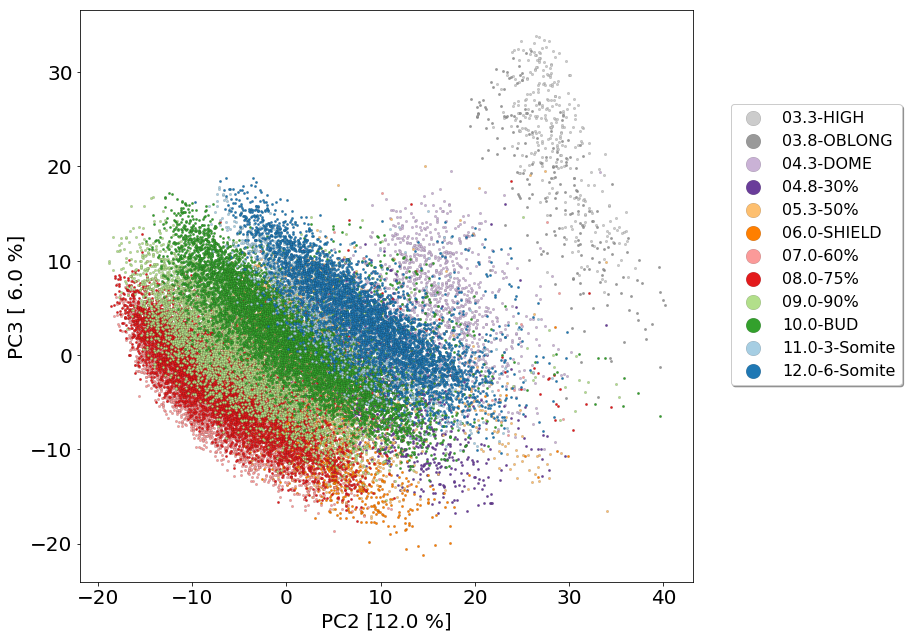

In [7]:
plot2D(X50PCs[:, 1:3], label=cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axes().set_aspect(aspect=1)
plt.xlabel("PC2 [%4.1f %%]" %var_exp[1])
plt.ylabel("PC3 [%4.1f %%]" %var_exp[2])

# UMAP

In [8]:
import umap
# in our implementation of FIt-SNE we use entropy = np.log(perplexity) whereas in
# umap one has entropy = np.log2(n_neigh) so we need to adjust:
# np.log(100) = np.log2(n_neigh) ==> n_neigh = 2**np.log(100)
# n_neigh [10-15] ==> perplexity [30-50]

H = np.log(100)
n_neigh = int(2**H)
print("n_neigh used: %d" %n_neigh)

start = time.time()
umap_p100 = umap.UMAP(n_neighbors=n_neigh)
Y_umap_p100_spec_init = umap_p100.fit_transform(X50PCs)
end = time.time()
print('UMAP embedding in %f sec' %(end-start))
#UMAP embedding in 442.310949 sec

n_neigh used: 24
UMAP embedding in 141.309581 sec


(-15.050021551719757,
 8.321300633279472,
 -15.960546337912163,
 11.397691078675336)

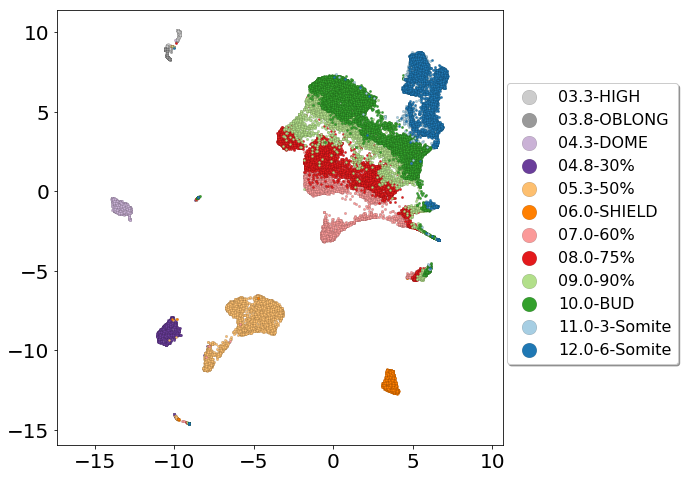

In [9]:
plot2D(Y_umap_p100_spec_init, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (8, 8))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [10]:
import umap
start = time.time()
umap = umap.UMAP()
umap_res = umap.fit(X50PCs)
Y_umap = umap_res.embedding_
end = time.time()
print('UMAP default embedding in %f sec' %(end-start))

UMAP default embedding in 112.369641 sec


(-15.965285088522002,
 11.270146624045385,
 -15.815917491838446,
 11.62352840759068)

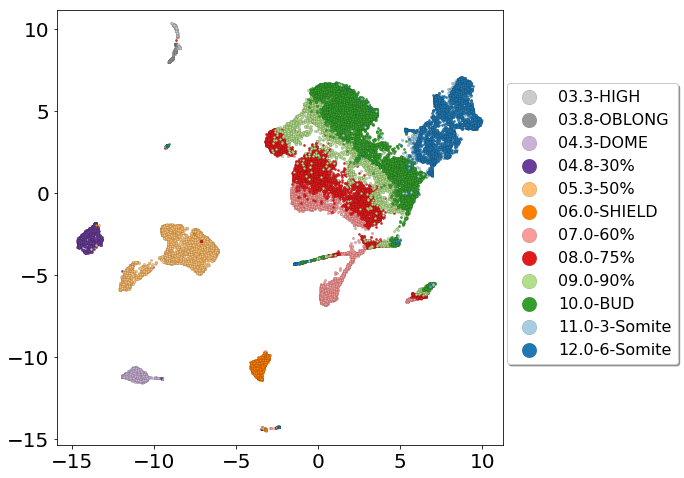

In [11]:
plot2D(Y_umap, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (8, 8))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

# t-SNE

In [36]:
start = time.time()
Y_tsne_p50 = diffusion_tsne(
    X50PCs, perplexity=50, seed=42, scale_probs = False,
    nthreads=nthreads, load_affinities="save")
end = time.time()
print('t-SNE embedding in %f sec' %(end-start))
betas50 = np.fromfile('betas.dat', dtype=np.dtype('d'))
degrees50 = np.fromfile('affinity_rowsums.dat', dtype=np.dtype('d'))
meandist50 = np.fromfile('mean_dists.dat', dtype=np.dtype('d'))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
t-SNE embedding in 75.704835 sec


(-45.286364685945564, 45.17709679891423, -47.05064696434639, 51.65636811354525)

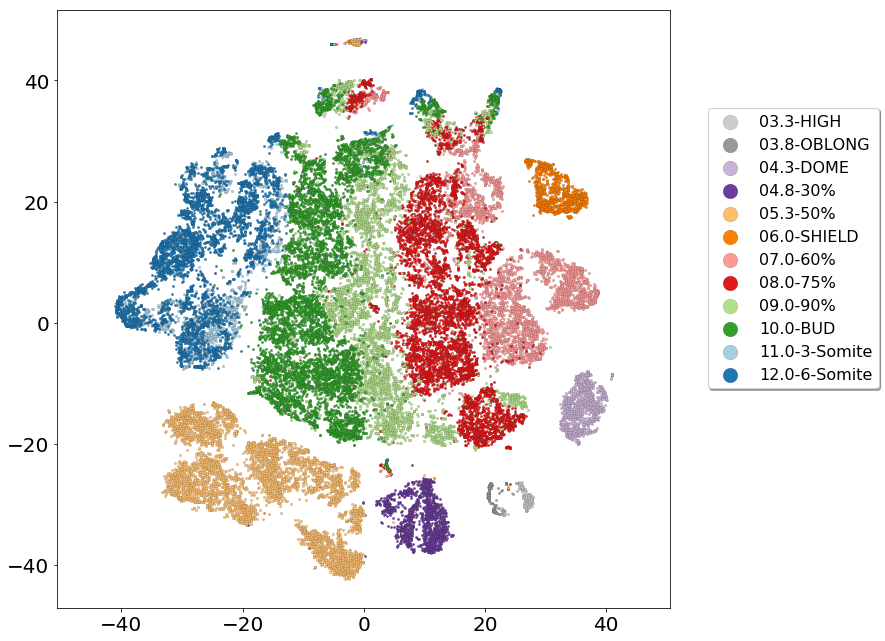

In [92]:
plot2D(Y_tsne_p50, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-45.101713674388265, 45.15493231378297, -46.84324018282069, 51.4489613320195)

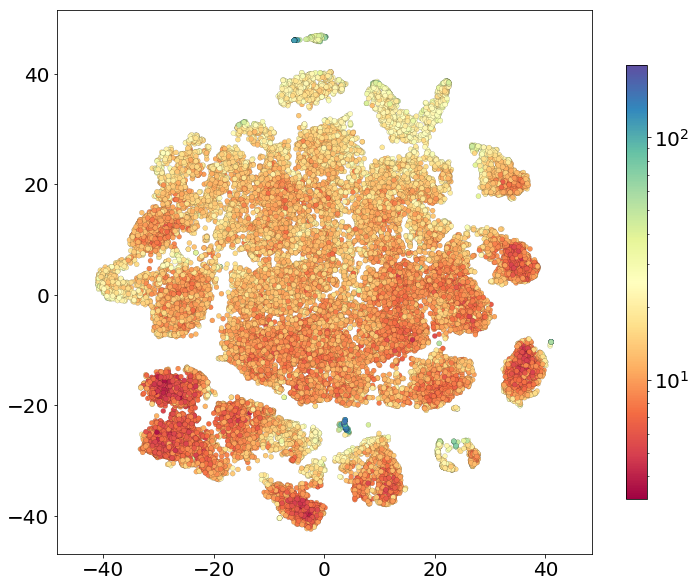

In [38]:
plot2D(Y_tsne_p50, label= 1/(2*betas50), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm())
plt.axis('equal')

In [39]:
start = time.time()  # 0.007 frac nnz
Y_tsne_p100 = diffusion_tsne(
    X50PCs, perplexity=100, seed=42, scale_probs = False,
    nthreads=nthreads, load_affinities="save")
end = time.time()
print('t-SNE embedding in %f sec' %(end-start))
betas100 = np.fromfile('betas.dat', dtype=np.dtype('d'))
degrees100 = np.fromfile('affinity_rowsums.dat', dtype=np.dtype('d'))
meandist100 = np.fromfile('mean_dists.dat', dtype=np.dtype('d'))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
t-SNE embedding in 83.157856 sec


(-44.48469741469377,
 43.22526331070491,
 -42.234787694439675,
 42.572083904895585)

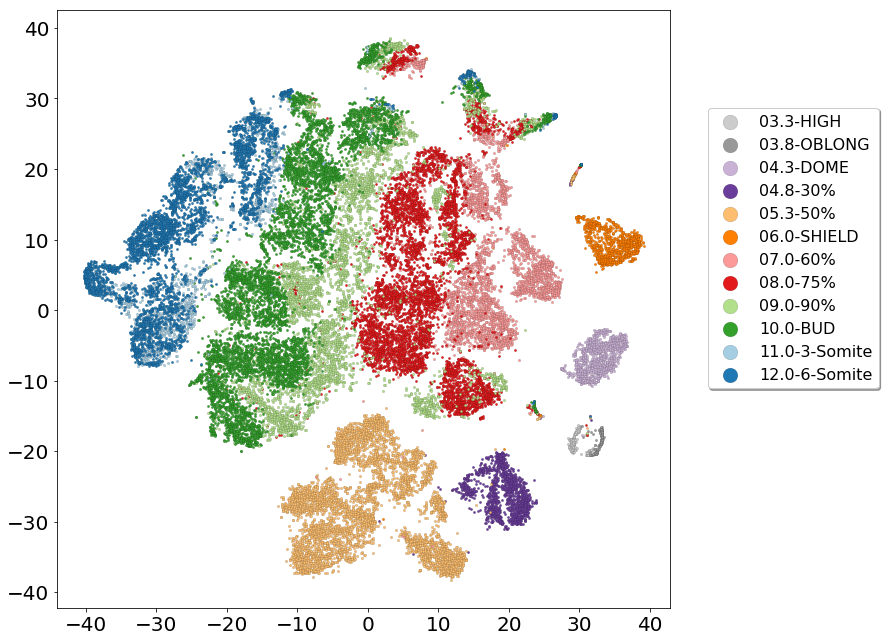

In [93]:
plot2D(Y_tsne_p100, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-44.300485923974264, 43.10625797988879, -42.10349658217147, 42.39106786401378)

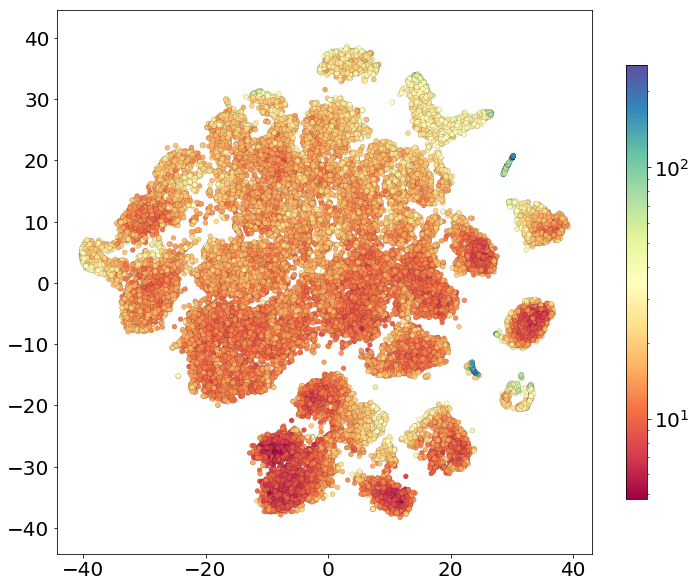

In [41]:
plot2D(Y_tsne_p100, label= 1/(2*betas100), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm()) # mpl.colors.PowerNorm(gamma=1./2.)))
plt.axis('equal')

In [42]:
start = time.time()  # 0.03 frac nnz
Y_tsne_p300 = diffusion_tsne(
    X50PCs, perplexity=300, seed=42, scale_probs = False,
    nthreads=nthreads, load_affinities="save")
end = time.time()
print('t-SNE embedding in %f sec' %(end-start))
betas300 = np.fromfile('betas.dat', dtype=np.dtype('d'))
degrees300 = np.fromfile('affinity_rowsums.dat', dtype=np.dtype('d'))
meandist300 = np.fromfile('mean_dists.dat', dtype=np.dtype('d'))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
t-SNE embedding in 129.815714 sec


(-35.62932816161849, 41.258969482808425, -32.9840414168866, 31.517890462932783)

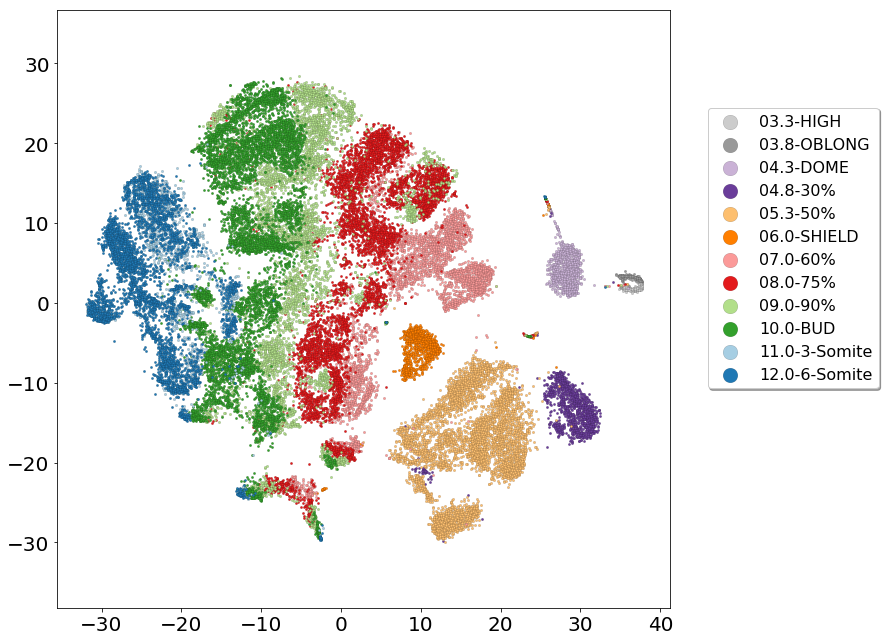

In [94]:
plot2D(Y_tsne_p300, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-35.47254481342433,
 41.25332460549259,
 -32.882678229523215,
 31.381403054588727)

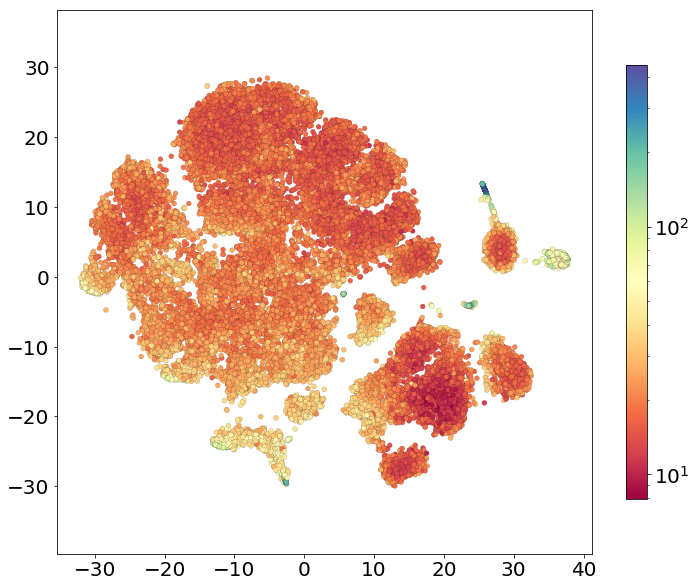

In [44]:
plot2D(Y_tsne_p300, label= 1/(2*betas300), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm()) # mpl.colors.PowerNorm(gamma=1./2.)))
plt.axis('equal')

In [45]:
start = time.time()
Y_tsne_p500 = diffusion_tsne(
    X50PCs, perplexity=500, seed=42, scale_probs = False,
    nthreads=nthreads, load_affinities="save")
end = time.time()
print('t-SNE embedding in %f sec' %(end-start))
betas500 = np.fromfile('betas.dat', dtype=np.dtype('d'))
degrees500 = np.fromfile('affinity_rowsums.dat', dtype=np.dtype('d'))
meandist500 = np.fromfile('mean_dists.dat', dtype=np.dtype('d'))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
t-SNE embedding in 172.046056 sec


(-31.4623674457516, 37.68966180191703, -27.59683095681433, 28.18754973828983)

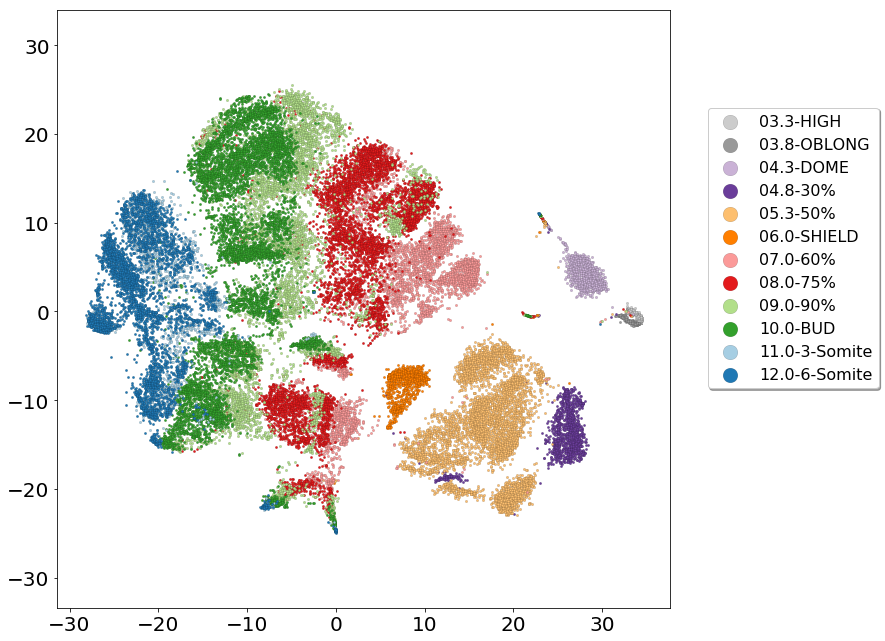

In [95]:
plot2D(Y_tsne_p500, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-31.321845781928367, 37.68479129052363, -27.476943948382814, 28.071795368311)

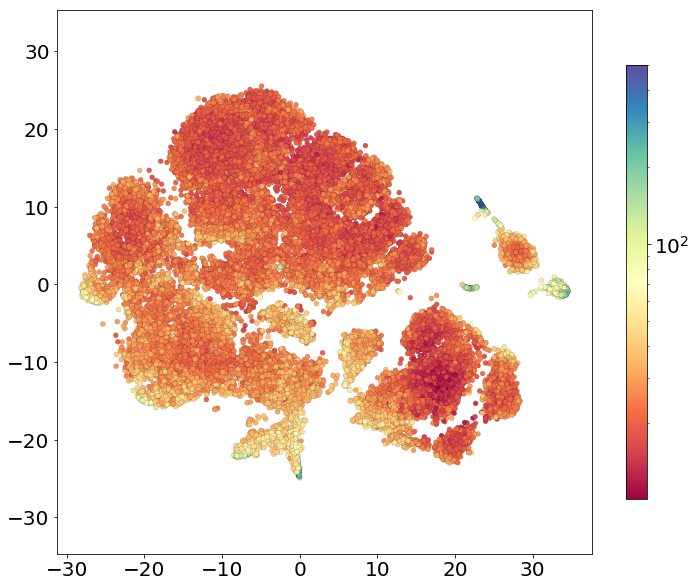

In [47]:
plot2D(Y_tsne_p500, label= 1/(2*betas500), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm()) # mpl.colors.PowerNorm(gamma=1./2.)))
plt.axis('equal')

In [48]:
start = time.time()
Y_tsne_p1000 = diffusion_tsne(
    X50PCs, perplexity=1000, seed=42, scale_probs = False,
    nthreads=nthreads, load_affinities="save")
end = time.time()
print('t-SNE embedding in %f sec' %(end-start))
betas1000 = np.fromfile('betas.dat', dtype=np.dtype('d'))
degrees1000 = np.fromfile('affinity_rowsums.dat', dtype=np.dtype('d'))
meandist1000 = np.fromfile('mean_dists.dat', dtype=np.dtype('d'))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
t-SNE embedding in 260.506824 sec


(-28.64357611275266,
 36.09152277196601,
 -18.330364948745057,
 21.893778744918343)

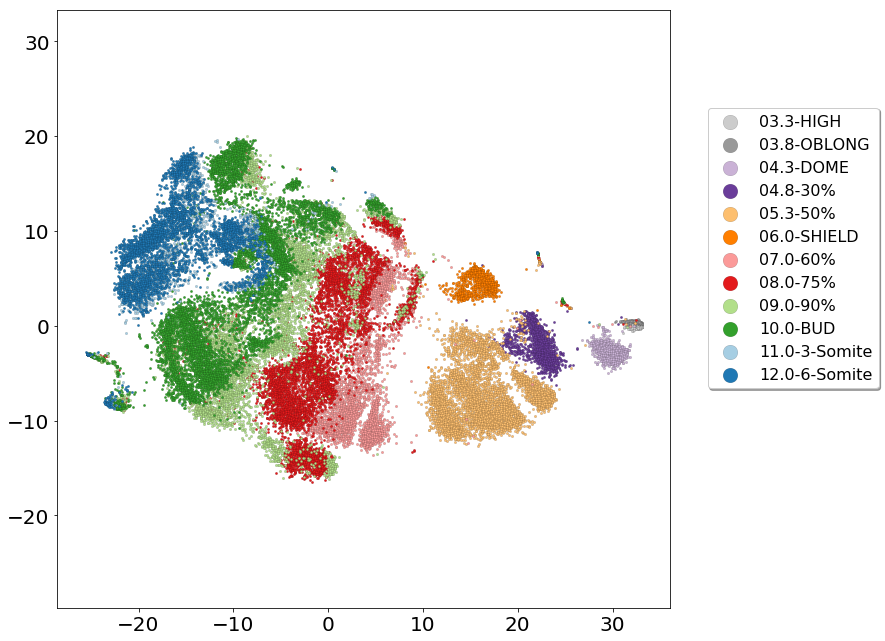

In [96]:
plot2D(Y_tsne_p1000, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-28.512303018235542, 36.0870926686348, -18.271599530517072, 21.81246974243578)

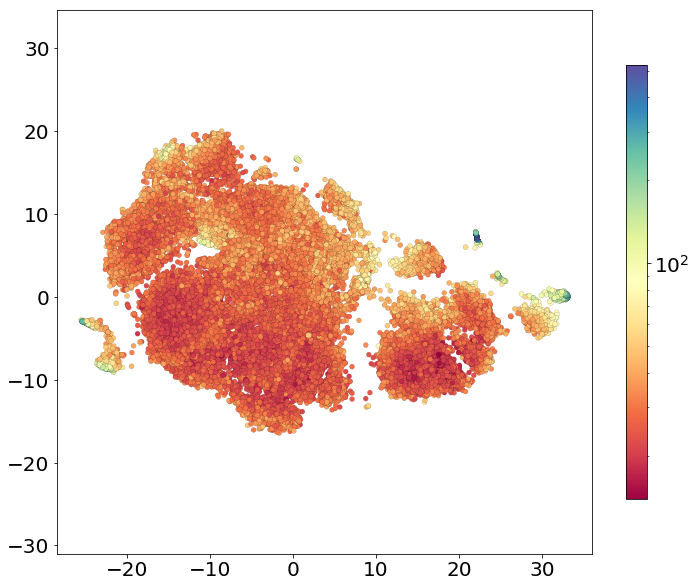

In [50]:
plot2D(Y_tsne_p1000, label= 1/(2*betas1000), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm()) # mpl.colors.PowerNorm(gamma=1./2.)))
plt.axis('equal')

In [52]:
import pickle
vanilla_tsne_res = {
    'Y_tsne_p50':Y_tsne_p50, 'betas50': betas50,
    'Y_tsne_p100':Y_tsne_p100, 'betas100': betas100,
    'Y_tsne_p300':Y_tsne_p300, 'betas300': betas300,
    'Y_tsne_p500':Y_tsne_p1000, 'betas500': betas500,
    'Y_tsne_p1000':Y_tsne_p1000, 'betas1000': betas1000,
}
with open('examples/Farrell2018/farrell_vanilla_tsne_res.pkl', 'wb') as handle:
    pickle.dump(vanilla_tsne_res, handle, protocol=pickle.HIGHEST_PROTOCOL)


# Scaled t-SNE

In [53]:
start = time.time()
Y_scaletsne_p50 = diffusion_tsne(
    X50PCs, perplexity=50, seed=42, scale_probs = True,
    nthreads=nthreads)
end = time.time()
print('Scale t-SNE embedding in %f sec' %(end-start))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
Scale t-SNE embedding in 78.169238 sec


(-47.04670983362339, 46.72284559028915, -50.99160242420333, 49.757352019591096)

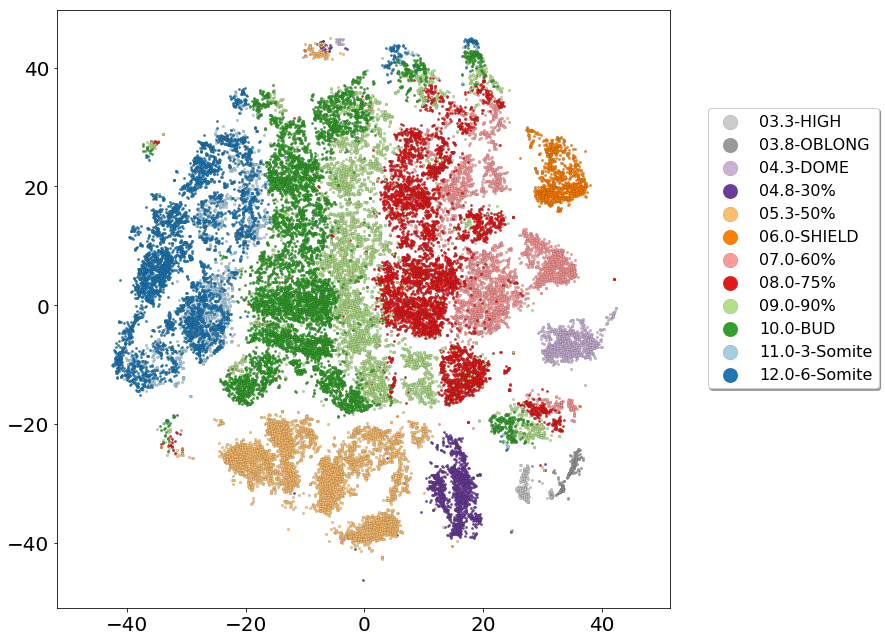

In [97]:
plot2D(Y_scaletsne_p50,cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-46.85805298250559, 46.691723462417336, -50.80162234396916, 49.53770943196154)

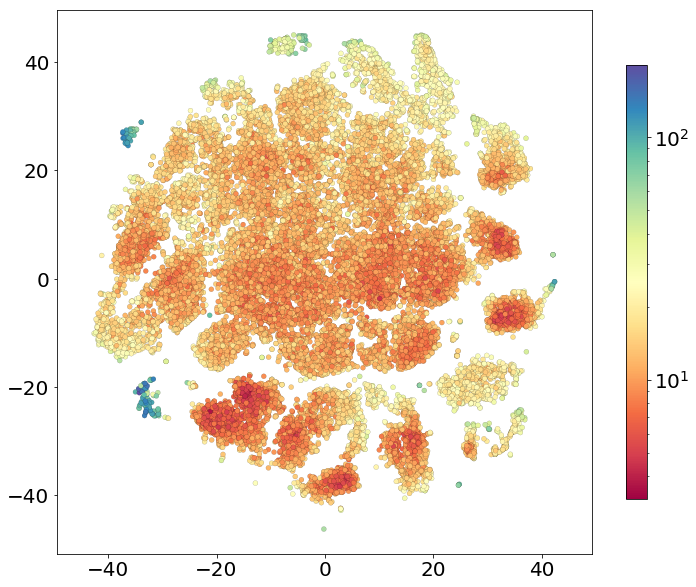

In [55]:
plot2D(Y_scaletsne_p50, label= 1/(2*betas50), s=25, figsize=(12,10), 
      norm= mpl.colors.LogNorm())
plt.axis('equal')

We note that as expected there is not much difference between vanilla t-SNE and the scaled t-SNE, because the local variances do not differ a lot across regions, and the bandwidth parameters are roughly the same, indicating that the standard t-SNE does not distort the data by much. 

In [56]:
start = time.time()
Y_scaletsne_p100 = diffusion_tsne(
    X50PCs, perplexity=100, seed=42, scale_probs = True,
    nthreads=nthreads)
end = time.time()
print('Scale t-SNE embedding in %f sec' %(end-start))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
Scale t-SNE embedding in 84.006279 sec


(-44.69448698241214, 45.50283144121543, -44.61929019652543, 46.621010895396935)

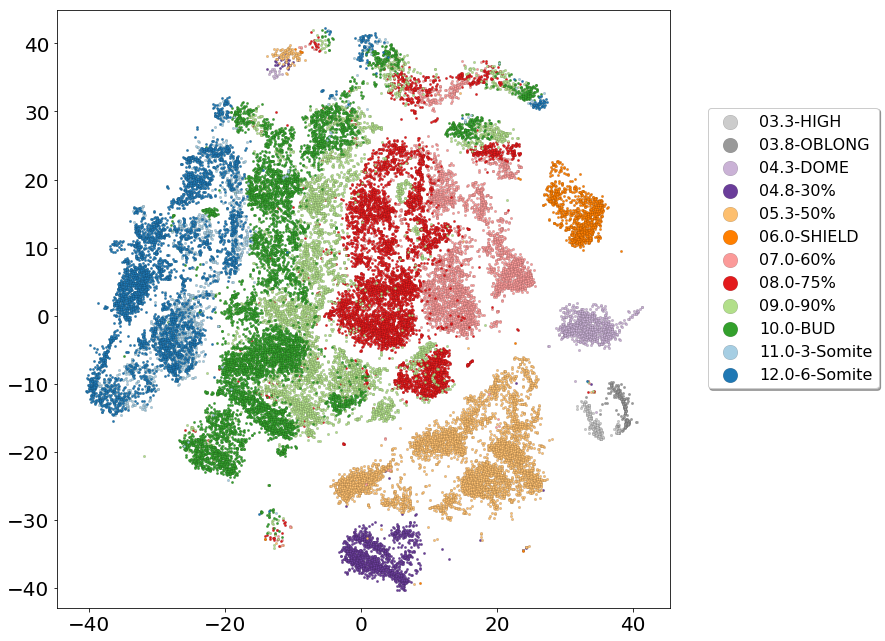

In [98]:
plot2D(Y_scaletsne_p100,cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-44.5131085568216, 45.47765381501642, -44.486415212463776, 46.424412947864596)

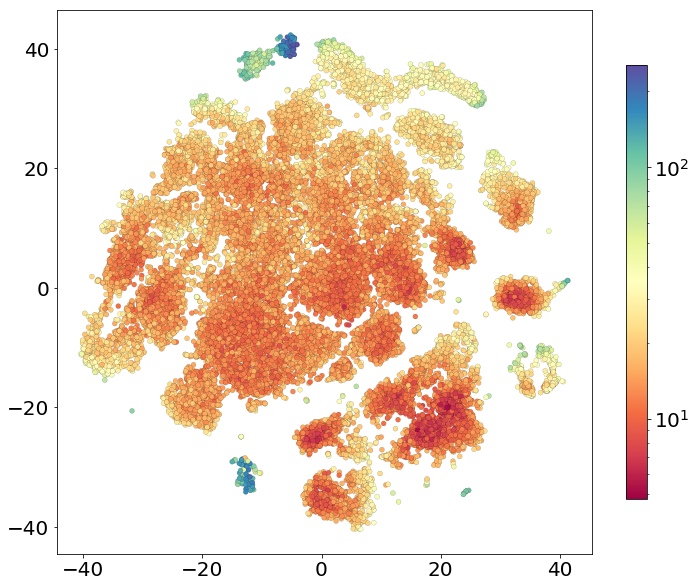

In [58]:
plot2D(Y_scaletsne_p100, label= 1/(2*betas100), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm())
plt.axis('equal')

In [59]:
start = time.time()
Y_scaletsne_p500 = diffusion_tsne(
    X50PCs, perplexity=500, seed=42, scale_probs = True,
    nthreads=nthreads, load_affinities="save")
end = time.time()
print('Scale t-SNE embedding in %f sec' %(end-start))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
Scale t-SNE embedding in 174.981814 sec


(-37.87905051741981,
 43.546267455195384,
 -30.663531601549728,
 39.86572295479493)

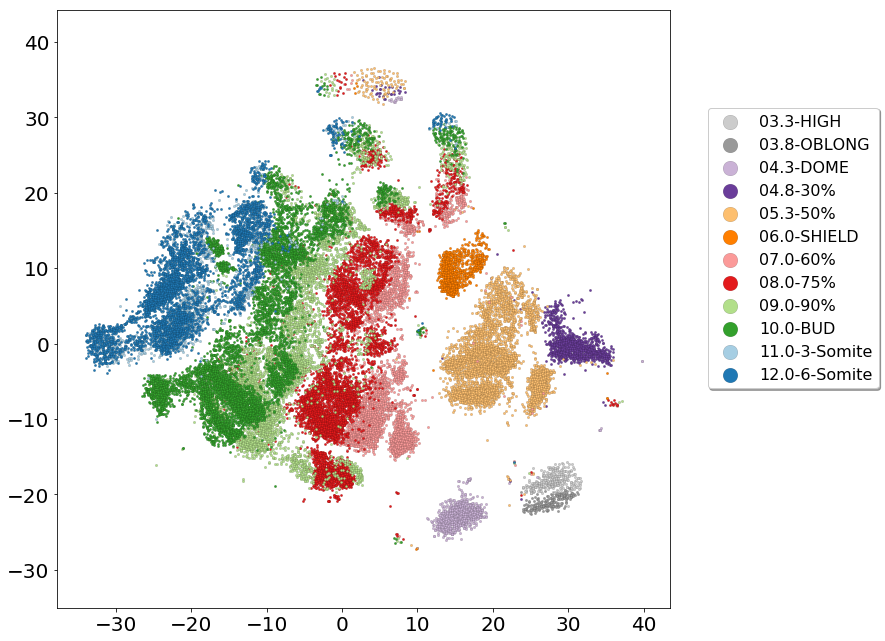

In [99]:
plot2D(Y_scaletsne_p500, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-37.71262264972012,
 43.523989294485276,
 -30.510313571762165,
 39.71516221757268)

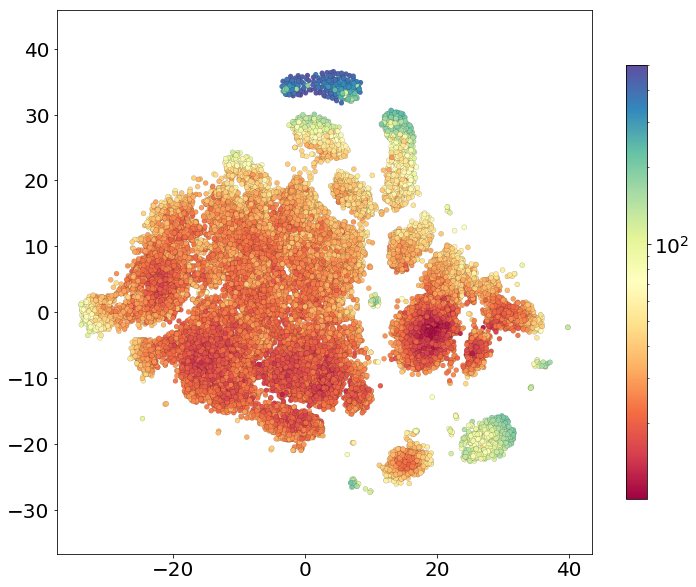

In [61]:
plot2D(Y_scaletsne_p500, label= 1/(2*betas500), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm())
plt.axis('equal')

In [62]:
start = time.time()
Y_scaletsne_p1000 = diffusion_tsne(
    X50PCs, perplexity=1000, seed=42, scale_probs = True,
    nthreads=nthreads, load_affinities="save")
end = time.time()
print('Scale t-SNE embedding in %f sec' %(end-start))

Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE
data_path: /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data.dat
Using compiled binary file: /bin/diffusion_tsne
Scale t-SNE embedding in 264.075991 sec


(-32.12795961542745, 38.27490778563154, -24.152805246106965, 31.0291809901751)

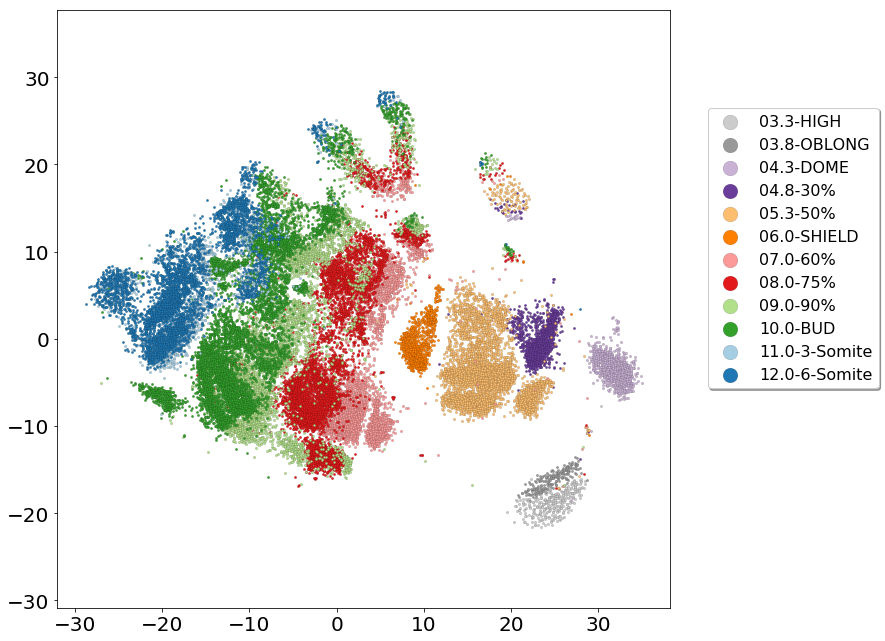

In [100]:
plot2D(Y_scaletsne_p1000, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

(-31.985732056251244, 38.24724000076495, -24.15012365627243, 30.91675078508439)

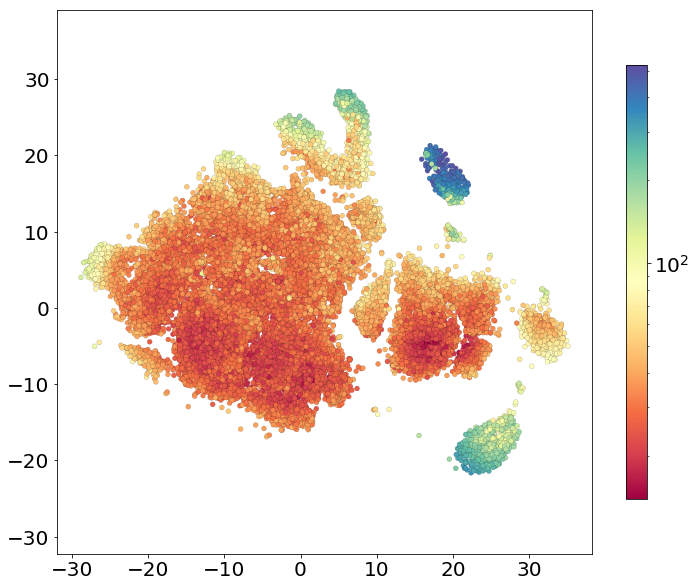

In [64]:
plot2D(Y_scaletsne_p1000, label= 1/(2*betas1000), s=25, figsize=(12,10),
      norm= mpl.colors.LogNorm())
plt.axis('equal')

In [65]:
import pickle
scale_tsne_res = {
    'Y_scaletsne_p50':Y_scaletsne_p50, 'betas50': betas50,
    'Y_scaletsne_p100':Y_scaletsne_p100, 'betas100': betas100,
    'Y_scaletsne_p500':Y_scaletsne_p500, 'betas500': betas500,
    'Y_scaletsne_p1000':Y_scaletsne_p1000, 'betas1000': betas1000
}
with open('examples/Farrell2018/farrell_scale_tsne_res.pkl', 'wb') as handle:
    pickle.dump(scale_tsne_res, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [66]:
idx = np.random.randint(low = 0, high = X50PCs.shape[0], size = 12000)
idx = np.unique(idx)
X50PCs_sub = X50PCs[idx, :]
X50PCs_sub.shape

(10308, 50)

# Diffusion t-SNE

In [68]:
start = time.time()
Y_difftsne_p50_t10 = diffusion_tsne(
    X50PCs, perplexity=50, seed=42, scale_probs = False,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/perp50_step10_affinities/")
end = time.time()
print('Diffusion t-SNE embedding in %f min' %((end-start)/60))
# Diffusion t-SNE embedding in 22.115429 min

Making directory ./data/farrell2018/perp50_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/perp50_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Diffusion t-SNE embedding in 14.115179 min


(-20.272296032880348,
 30.293858885838898,
 -22.81089470819378,
 19.264962870390406)

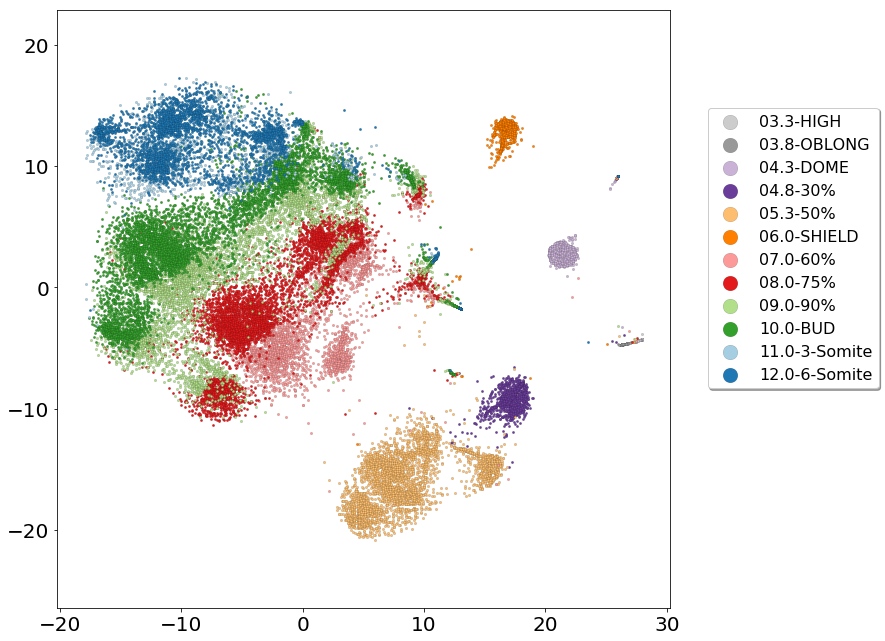

In [101]:
plot2D(Y_difftsne_p50_t10, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [70]:
start = time.time()
Y_difftsne_p200_t10 = diffusion_tsne(
    X50PCs, perplexity=200, seed=42, scale_probs = False,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/perp100_step10_affinities/")
end = time.time()
print('Diffusion t-SNE embedding in %f min' %((end-start)/60))
# Diffusion t-SNE embedding in 22.115429 min

Making directory ./data/farrell2018/perp100_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/perp100_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Diffusion t-SNE embedding in 17.746314 min


(-17.641189029817536,
 24.17022669410242,
 -11.918775451563576,
 10.700817985287461)

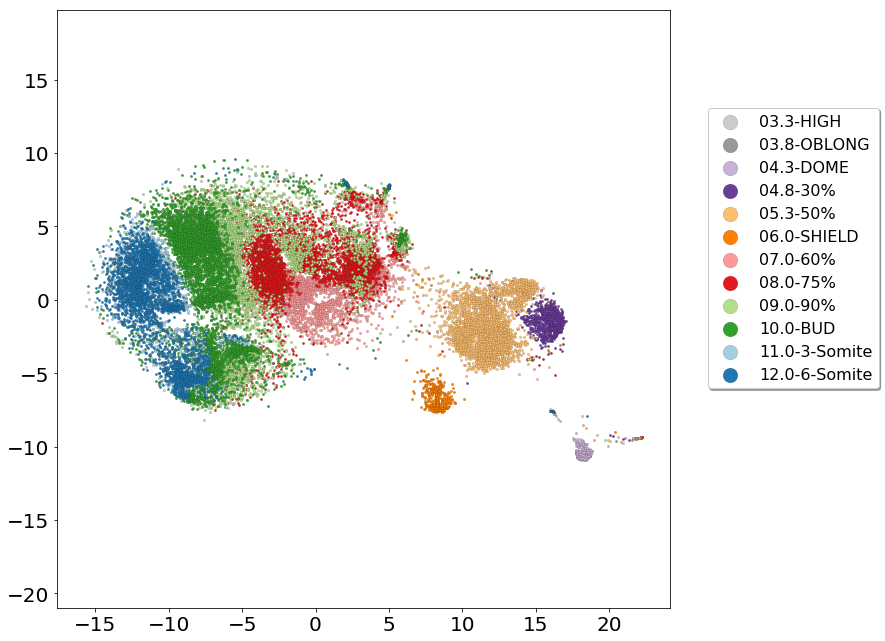

In [102]:
plot2D(Y_difftsne_p200_t10, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [72]:
start = time.time()
Y_difftsne_p300_t10 = diffusion_tsne(
    X50PCs, perplexity=300, seed=42, scale_probs = False,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/perp300_step10_affinities/")
end = time.time()
print('Diffusion t-SNE embedding in %f min' %((end-start)/60))
# Diffusion t-SNE embedding in 22.115429 min

Making directory ./data/farrell2018/perp300_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/perp300_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Diffusion t-SNE embedding in 21.337465 min


(-14.328565391303066,
 18.092544111372302,
 -12.168070869931658,
 9.74904751934969)

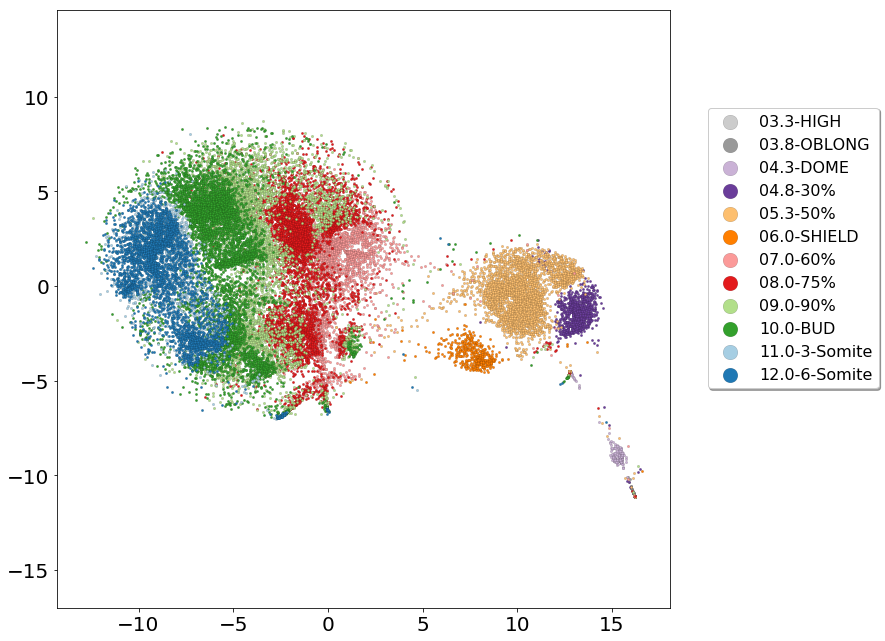

In [103]:
plot2D(Y_difftsne_p300_t10, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [87]:
start = time.time()
Y_difftsne_p500_t10 = diffusion_tsne(
    X50PCs, perplexity=500, seed=42, scale_probs = False,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/perp500_step10_affinities/")
end = time.time()
print('Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/perp500_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/perp500_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Diffusion t-SNE embedding in 34.545047 min


(-10.448474793899779, 15.26512462302452, -6.270889326044322, 7.257521219621201)

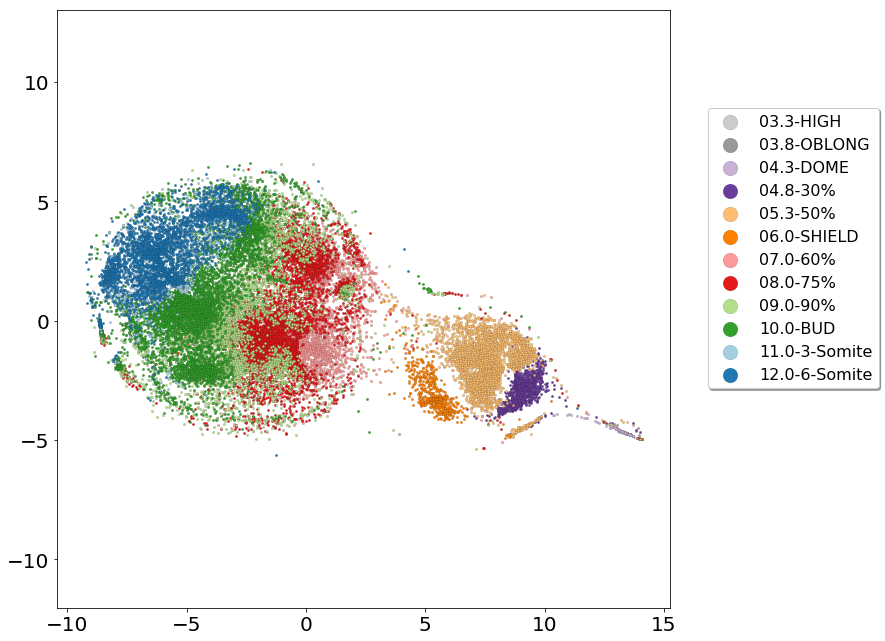

In [108]:
plot2D(Y_difftsne_p500_t10, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [74]:
start = time.time()
Y_difftsne_p1000_t10 = diffusion_tsne(
    X50PCs, perplexity=1000, seed=42, scale_probs = False,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/perp1000_step10_affinities/")
end = time.time()
print('Diffusion t-SNE embedding in %f min' %((end-start)/60))
# Diffusion t-SNE embedding in 22.115429 min

Making directory ./data/farrell2018/perp1000_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/perp1000_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Diffusion t-SNE embedding in 30.160588 min


(-6.051336476818431, 6.099032995840416, -6.37091350967591, 6.083503589118443)

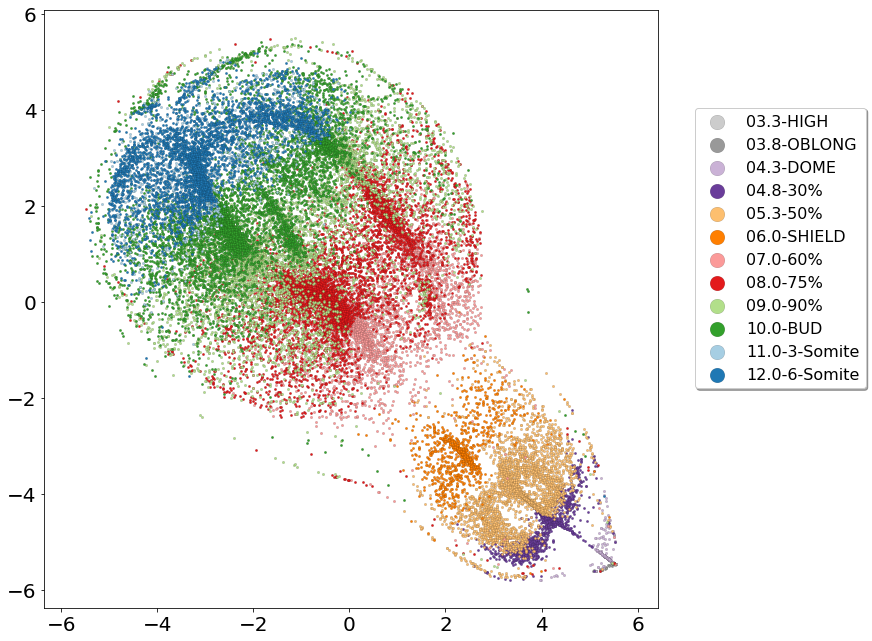

In [104]:
plot2D(Y_difftsne_p1000_t10, cell_info["Stage"], 
        col_map = cols, s=6, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [76]:
import pickle
difftsne_res = {
    'Y_difftsne_p50_t10':Y_difftsne_p50_t10, 
    'Y_difftsne_p200_t10':Y_difftsne_p200_t10, 
    'Y_difftsne_p300_t10':Y_difftsne_p300_t10, 
    'Y_difftsne_p500_t10':Y_difftsne_p500_t10,
    'Y_difftsne_p1000_t10':Y_difftsne_p1000_t10, 
}
with open('farrell_difftsne_res.pkl', 'wb') as handle:
    pickle.dump(difftsne_res, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Scaled Diffusion t-SNE

In [77]:
start = time.time()
Y_scaled_difftsne_p50_t10 = diffusion_tsne(
    X50PCs, perplexity=50, seed=42, scale_probs = True,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp50_step10_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp50_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/scale_perp50_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 16.924542 min


(-31.111549001502173,
 36.540246818049596,
 -30.711113407094874,
 32.470388704033574)

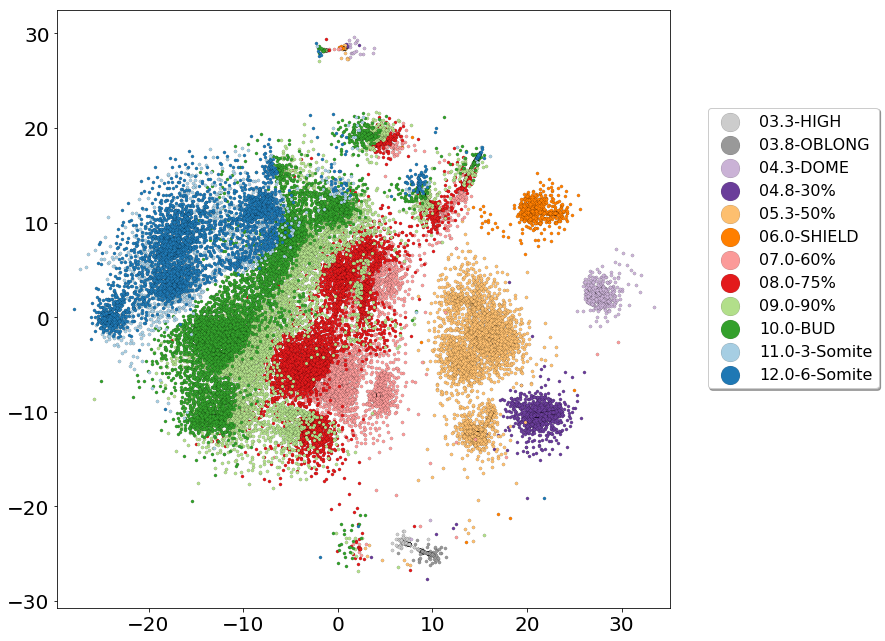

In [105]:
plot2D(Y_scaled_difftsne_p50_t10,cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [109]:
start = time.time()
Y_scaled_difftsne_p100_t20 = diffusion_tsne(
    X50PCs, perplexity=100, seed=42, scale_probs = True,
    time_steps = 20, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp100_step20_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp100_step20_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/scale_perp100_step20_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 35.597373 min


(-25.9986433800036,
 31.237210833922116,
 -23.830822343577694,
 24.782726238585326)

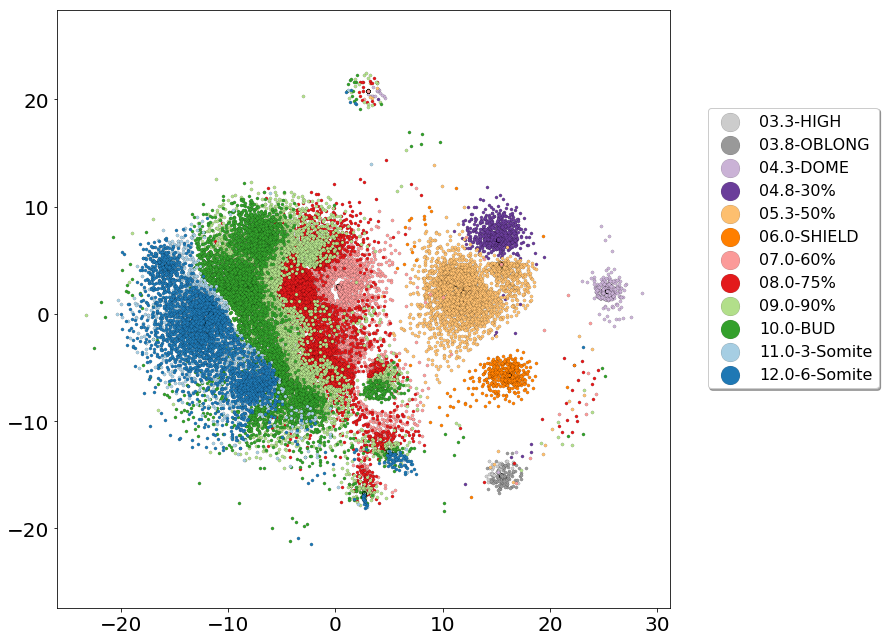

In [110]:
plot2D(Y_scaled_difftsne_p100_t20,cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [79]:
start = time.time()
Y_scaled_difftsne_p300_t10 = diffusion_tsne(
    X50PCs, perplexity=300, seed=42, scale_probs = True,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp300_step10_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp300_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/scale_perp300_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 31.287494 min


(-25.68377825636171,
 27.924942051066616,
 -20.957790192074597,
 21.562001818115167)

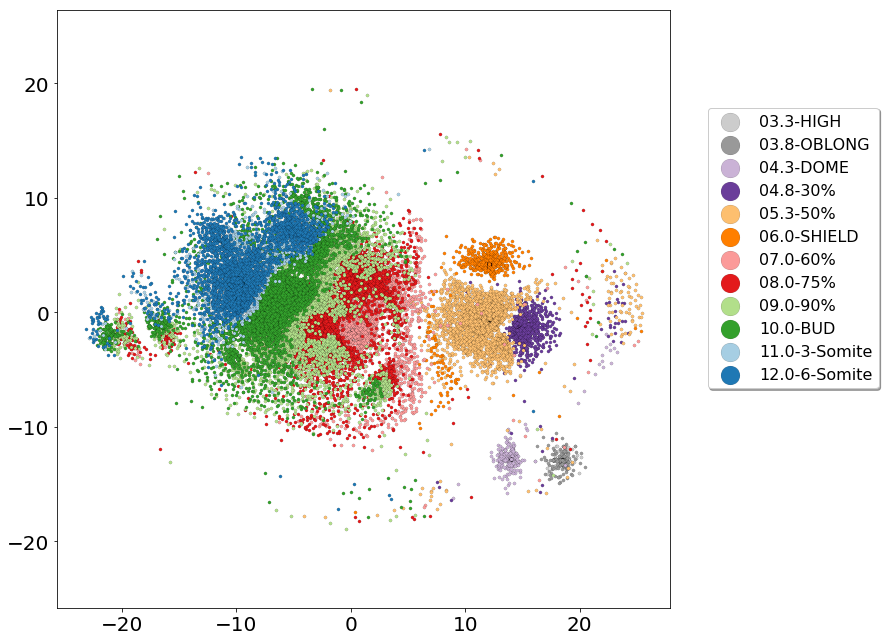

In [106]:
plot2D(Y_scaled_difftsne_p300_t10, cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [84]:
start = time.time()
Y_scaled_difftsne_p300_t50 = diffusion_tsne(
    X50PCs, perplexity=300, seed=42, scale_probs = True,
    time_steps = 50, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp300_step50_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp300_step50_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/scale_perp300_step50_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 94.466403 min


(-19.705112336856786,
 18.558082368875677,
 -16.578352217611503,
 16.646244308983505)

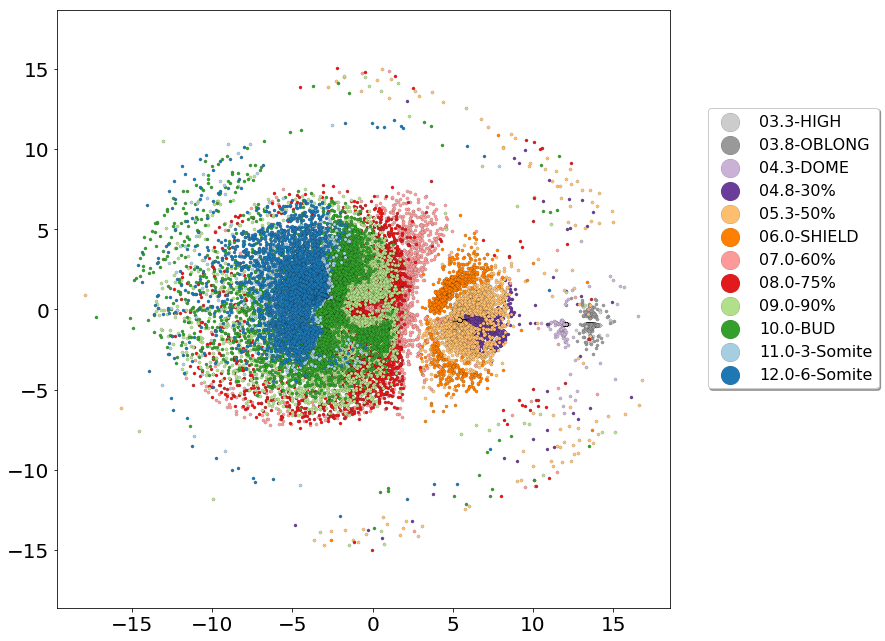

In [117]:
plot2D(Y_scaled_difftsne_p300_t50, cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [118]:
start = time.time()
Y_scaled_difftsne_p500_t5 = diffusion_tsne(
    X50PCs, perplexity=500, seed=42, scale_probs = True,
    time_steps = 5, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp500_step5_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp500_step5_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/scale_perp500_step5_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 21.873660 min


(-26.1713514023654, 28.4354970959111, -21.97390377613826, 22.93172814704579)

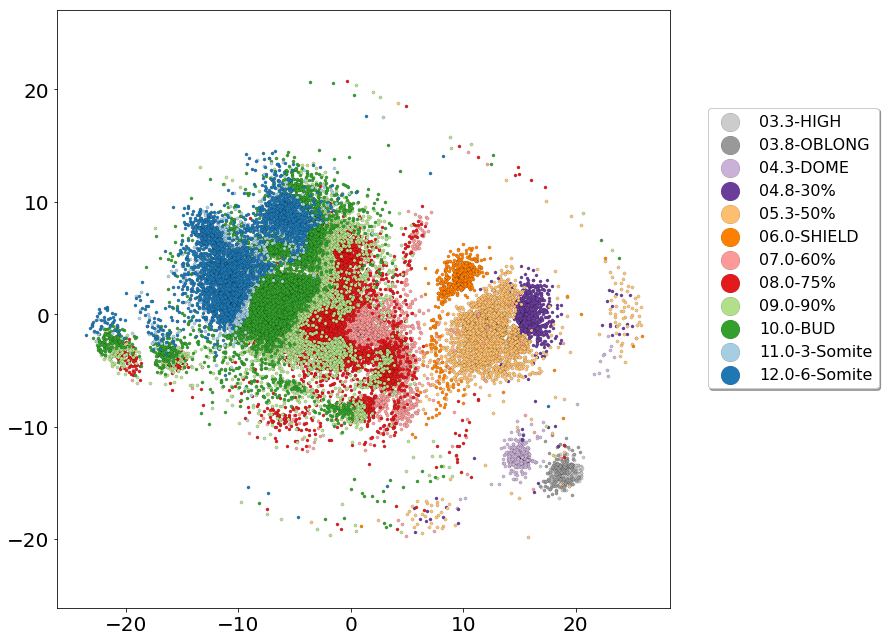

In [119]:
plot2D(Y_scaled_difftsne_p500_t5, cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [81]:
start = time.time()
Y_scaled_difftsne_p500_t10 = diffusion_tsne(
    X50PCs, perplexity=500, seed=42, scale_probs = True,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp500_step10_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp500_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/perp50_step10_affinities/data/farrell2018/scale_perp500_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 35.876959 min


(-21.739159679695373,
 24.248537412165277,
 -19.217078469349875,
 19.748205213236638)

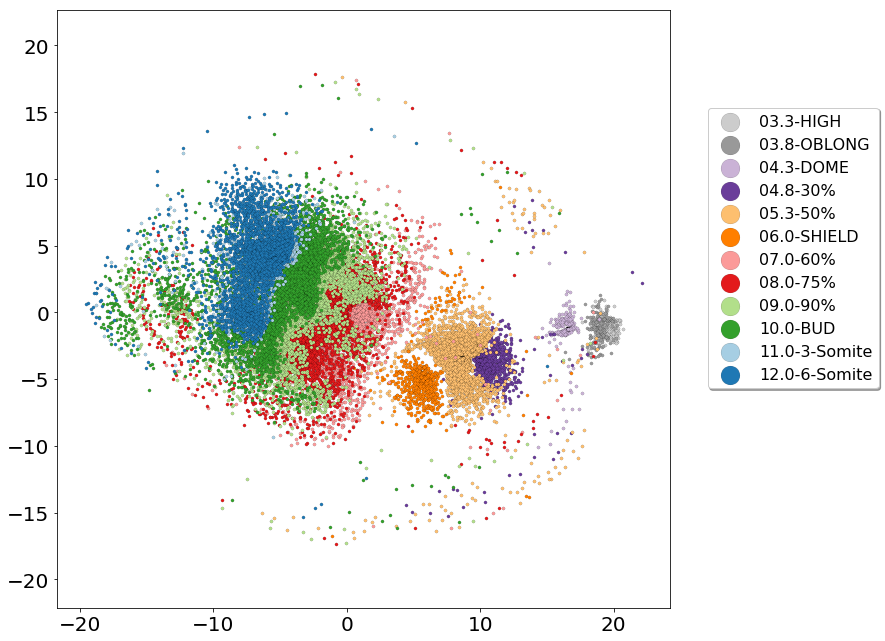

In [107]:
plot2D(Y_scaled_difftsne_p500_t10, cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [112]:
start = time.time()
Y_scaled_difftsne_p500_t20 = diffusion_tsne(
    X50PCs, perplexity=500, seed=42, scale_probs = True,
    time_steps = 20, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp500_step20_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp500_step20_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/scale_perp500_step20_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 57.419713 min


(-20.407195337601948,
 21.2410987003823,
 -17.131589548637084,
 16.866394195121416)

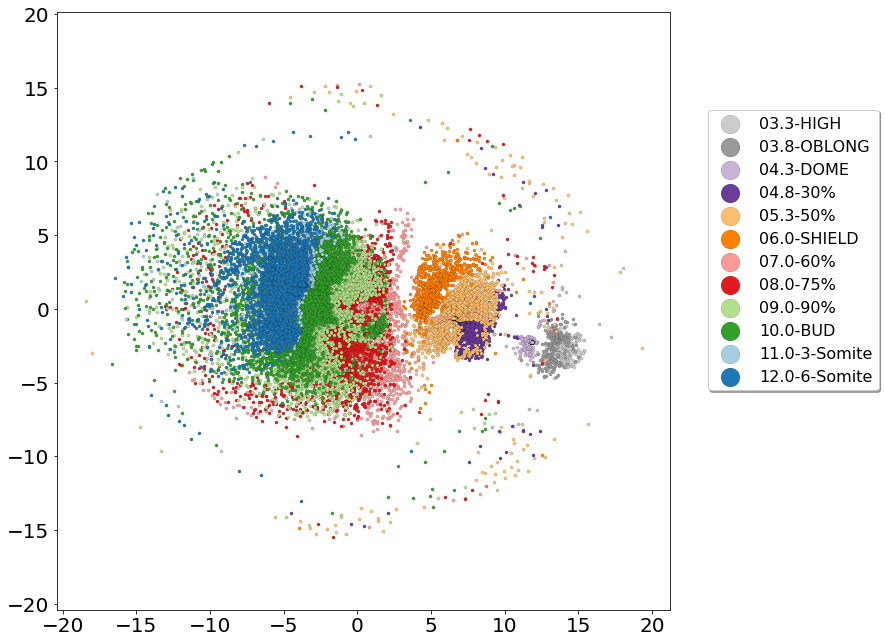

In [113]:
plot2D(Y_scaled_difftsne_p500_t20, cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [114]:
start = time.time()
Y_scaled_difftsne_p1000_t10 = diffusion_tsne(
    X50PCs, perplexity=1000, seed=42, scale_probs = True,
    time_steps = 10, nthreads=nthreads, load_affinities="save",
    save_files=True, affinities_dir = "./data/farrell2018/scale_perp1000_step10_affinities/")
end = time.time()
print('Scaled Diffusion t-SNE embedding in %f min' %((end-start)/60))

Making directory ./data/farrell2018/scale_perp1000_step10_affinities/
Current directory /home/lanhuong/Projects/ManifoldLearning/DiffusionTSNE/data/farrell2018/scale_perp1000_step10_affinities
data_path: data.dat
Using compiled binary file: /bin/diffusion_tsne
Scaled Diffusion t-SNE embedding in 40.695904 min


(-18.873723870394084,
 19.316374172568757,
 -15.856953514710941,
 15.978105876136578)

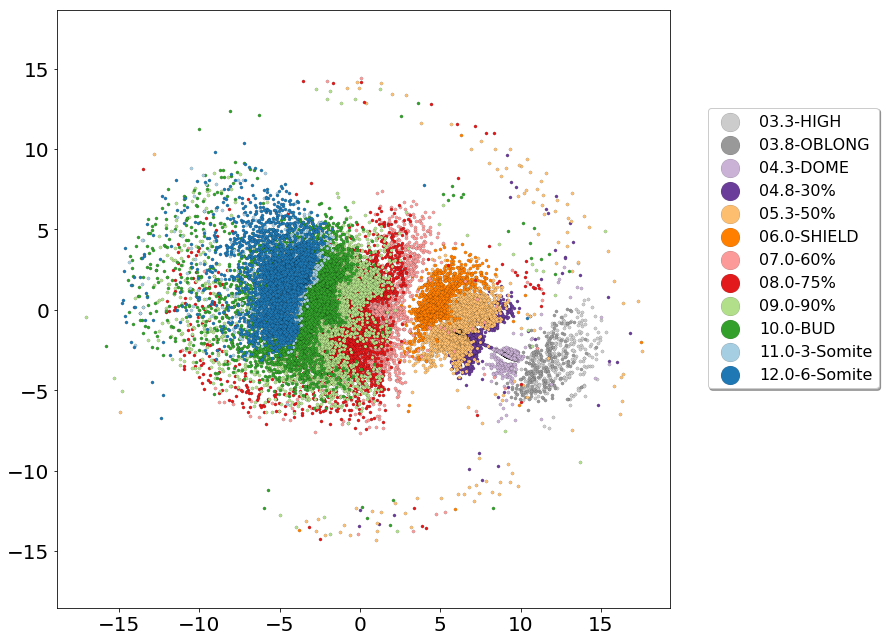

In [115]:
plot2D(Y_scaled_difftsne_p1000_t10, cell_info["Stage"], 
        col_map = cols, s=10, figsize = (11, 11))
plt.legend(
    fontsize=16, markerscale=6,
    loc='upper center', bbox_to_anchor=(1.2, 0.85), 
    shadow=True, ncol=1)
plt.axis('equal')

In [120]:
import pickle
scale_difftsne_res = {
    'Y_scaled_difftsne_p50_t10':Y_scaled_difftsne_p50_t10, 
    'Y_scaled_difftsne_p100_t20':Y_scaled_difftsne_p100_t20,
    'Y_scaled_difftsne_p300_t10':Y_scaled_difftsne_p300_t10, 
    'Y_scaled_difftsne_p300_t50':Y_scaled_difftsne_p300_t50,
    'Y_scaled_difftsne_p500_t5':Y_scaled_difftsne_p500_t5,
    'Y_scaled_difftsne_p500_t10':Y_scaled_difftsne_p500_t10, 
    'Y_scaled_difftsne_p500_t20':Y_scaled_difftsne_p500_t20,
    'Y_scaled_difftsne_p1000_t10':Y_scaled_difftsne_p1000_t10
}
with open('examples/Farrell2018/farrell_scale_difftsne_res.pkl', 'wb') as handle:
    pickle.dump(scale_difftsne_res, handle, protocol=pickle.HIGHEST_PROTOCOL)
